In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import plotly.express as px
import plotly.graph_objects as go
import random
import time
px.set_mapbox_access_token(open('mapbox_token.txt').read())

In [2]:
# sampling from original data source

start_time = time.time()

p = 0.1  # 10% of the lines
# keep the header, then take only 10% of lines
# if random from [0,1] interval is greater than 0.1 the row will be skipped
tripdata_dwn = pd.read_csv(
         '/Users/bkuo/Local Documents/Bootcamp 2020/Project/Capstone/CitiBikeCapStone/Data/Trip data/riders_cleaned.csv.gz',
         compression='gzip',         
         skiprows=lambda i: i>0 and random.random() > p
)

print("--- %s seconds ---" % (time.time() - start_time))

/Users/bkuo/anaconda3/lib/python3.6/site-packages/IPython/core/interactiveshell.py:2785: DtypeWarning:

Columns (15) have mixed types. Specify dtype option on import or set low_memory=False.



--- 334.48649191856384 seconds ---


In [3]:
tripdata_dwn.columns

Index(['Unnamed: 0', 'index', 'tripduration', 'starttime', 'stoptime',
       'start station id', 'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender', 'year', 'start_date', 'stop_date', 'start_hour',
       'stop_hour', 'start_min', 'stop_min', 'season', 'dayofweek',
       'start_interval', 'stop_interval'],
      dtype='object')

In [4]:
tripdata_dwn.head()

,Unnamed: 0,index,tripduration,starttime,stoptime,start station id,start station name,start station latitude,start station longitude,end station id,...,start_date,stop_date,start_hour,stop_hour,start_min,stop_min,season,dayofweek,start_interval,stop_interval
0,16,16,815,2017-09-01 00:02:02,2017-09-01 00:15:37,412,Forsyth St & Canal St,40.715816,-73.994224,382,...,2017-09-01,2017-09-01,0,0,0,0,fall,Friday,0:00,0:00
1,24,24,408,2017-09-01 00:02:39,2017-09-01 00:09:28,409,DeKalb Ave & Skillman St,40.690649,-73.956431,275,...,2017-09-01,2017-09-01,0,0,0,0,fall,Friday,0:00,0:00
2,26,26,1499,2017-09-01 00:03:06,2017-09-01 00:28:06,238,Bank St & Washington St,40.736197,-74.008592,518,...,2017-09-01,2017-09-01,0,0,0,0,fall,Friday,0:00,0:00
3,32,32,290,2017-09-01 00:03:24,2017-09-01 00:08:14,3429,Hanson Pl & Ashland Pl,40.685068,-73.977908,3421,...,2017-09-01,2017-09-01,0,0,0,0,fall,Friday,0:00,0:00
4,44,44,656,2017-09-01 00:04:30,2017-09-01 00:15:26,265,Stanton St & Chrystie St,40.722293,-73.991475,376,...,2017-09-01,2017-09-01,0,0,0,0,fall,Friday,0:00,0:00


In [5]:
tripdata_dwn.describe()

,Unnamed: 0,index,tripduration,start station id,start station latitude,start station longitude,end station id,end station latitude,end station longitude,bikeid,gender,year,start_hour,stop_hour,start_min,stop_min
count,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07,1.103139e+07
mean,5.516452e+07,5.517066e+07,1.019947e+03,1.345889e+03,4.073728e+01,-7.398396e+01,1.337707e+03,4.073693e+01,-7.398410e+01,2.576226e+04,1.129756e+00,2.017304e+03,1.398118e+01,1.414393e+01,2.001122e+01,2.001122e+01
std,3.185496e+07,3.186172e+07,1.171607e+04,1.380165e+03,3.996363e-02,5.322189e-02,1.377917e+03,5.141046e-02,7.942226e-02,8.362410e+03,5.658526e-01,2.066985e+00,4.830150e+00,4.882962e+00,1.635126e+01,1.635126e+01
min,1.600000e+01,1.600000e+01,6.000000e+01,7.200000e+01,0.000000e+00,-7.403423e+01,7.200000e+01,0.000000e+00,-7.408364e+01,1.452900e+04,0.000000e+00,2.013000e+03,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,2.759115e+07,2.759196e+07,3.820000e+02,3.560000e+02,4.071894e+01,-7.399683e+01,3.540000e+02,4.071882e+01,-7.399705e+01,1.853600e+04,1.000000e+00,2.016000e+03,1.000000e+01,1.000000e+01,0.000000e+00,0.000000e+00
50%,5.514982e+07,5.515071e+07,6.440000e+02,4.830000e+02,4.073782e+01,-7.398714e+01,4.820000e+02,4.073705e+01,-7.398752e+01,2.492400e+04,1.000000e+00,2.018000e+03,1.500000e+01,1.500000e+01,2.000000e+01,2.000000e+01
75%,8.275471e+07,8.277508e+07,1.121000e+03,3.142000e+03,4.075527e+01,-7.397536e+01,3.141000e+03,4.075514e+01,-7.397574e+01,3.156100e+04,1.000000e+00,2.019000e+03,1.800000e+01,1.800000e+01,4.000000e+01,4.000000e+01
max,1.103416e+08,1.103623e+08,9.254340e+06,4.249000e+03,4.550636e+01,0.000000e+00,4.249000e+03,4.550636e+01,0.000000e+00,4.990100e+04,2.000000e+00,2.020000e+03,2.300000e+01,2.300000e+01,4.000000e+01,4.000000e+01


In [6]:
tripdata_dwn.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11031393 entries, 0 to 11031392
Data columns (total 28 columns):
Unnamed: 0                 int64
index                      int64
tripduration               int64
starttime                  object
stoptime                   object
start station id           int64
start station name         object
start station latitude     float64
start station longitude    float64
end station id             int64
end station name           object
end station latitude       float64
end station longitude      float64
bikeid                     int64
usertype                   object
birth year                 object
gender                     int64
year                       int64
start_date                 object
stop_date                  object
start_hour                 int64
stop_hour                  int64
start_min                  int64
stop_min                   int64
season                     object
dayofweek                  object
start_int

In [7]:
tripdata_dwn.isna().sum()

Unnamed: 0                      0
index                           0
tripduration                    0
starttime                       0
stoptime                        0
start station id                0
start station name              0
start station latitude          0
start station longitude         0
end station id                  0
end station name                0
end station latitude            0
end station longitude           0
bikeid                          0
usertype                     5054
birth year                 497783
gender                          0
year                            0
start_date                      0
stop_date                       0
start_hour                      0
stop_hour                       0
start_min                       0
stop_min                        0
season                          0
dayofweek                       0
start_interval                  0
stop_interval                   0
dtype: int64

In [8]:
# making a copy of original sample
tripdata = tripdata_dwn.copy() 

In [9]:
# clean birth year
tripdata['birth year'] = tripdata['birth year'].fillna(0)
tripdata[tripdata['birth year'] == '\\N'] = 0
tripdata['birth year'] = tripdata['birth year'].astype(float).astype(int) #can't pass float in string to int

In [10]:
# adding some more features
tripdata.starttime = pd.to_datetime(tripdata['starttime'])
tripdata.stoptime = pd.to_datetime(tripdata['stoptime'])
tripdata['age'] = [2020 - yr if yr != 0 else yr for yr in tripdata['birth year']]
tripdata['peak'] = [1 if p > 5 and p < 20 else 0 for p in tripdata.start_hour ]
tripdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11031393 entries, 0 to 11031392
Data columns (total 30 columns):
Unnamed: 0                 int64
index                      int64
tripduration               int64
starttime                  datetime64[ns]
stoptime                   datetime64[ns]
start station id           int64
start station name         object
start station latitude     float64
start station longitude    float64
end station id             int64
end station name           object
end station latitude       float64
end station longitude      float64
bikeid                     int64
usertype                   object
birth year                 int64
gender                     int64
year                       int64
start_date                 object
stop_date                  object
start_hour                 int64
stop_hour                  int64
start_min                  int64
stop_min                   int64
season                     object
dayofweek                  o

In [11]:
tripdata.columns

Index(['Unnamed: 0', 'index', 'tripduration', 'starttime', 'stoptime',
       'start station id', 'start station name', 'start station latitude',
       'start station longitude', 'end station id', 'end station name',
       'end station latitude', 'end station longitude', 'bikeid', 'usertype',
       'birth year', 'gender', 'year', 'start_date', 'stop_date', 'start_hour',
       'stop_hour', 'start_min', 'stop_min', 'season', 'dayofweek',
       'start_interval', 'stop_interval', 'age', 'peak'],
      dtype='object')

In [13]:
df = tripdata


fig = px.scatter_matrix(df,
    dimensions=['tripduration', 'gender' ,'dayofweek', 'age', 'peak'])
fig.show()

In [14]:
# getting distinct lat lon using average by stations
s_lat_lon = tripdata[['start station name', 'start station id','start station latitude', 'start station longitude']]
s_lat_lon = s_lat_lon.drop_duplicates().rename(columns = {'start station name':'station', 'start station id':'station_id','start station latitude':'latitude', 
                            'start station longitude':'longitude'})
e_lat_lon = tripdata[['end station name', 'end station id', 'end station latitude', 'end station longitude']]
e_lat_lon = e_lat_lon.drop_duplicates().rename(columns = {'end station name':'station', 'end station id':'station_id','end station latitude':'latitude', 
                            'end station longitude':'longitude'})

stn_lat_lon = pd.concat([s_lat_lon, e_lat_lon]).drop_duplicates()
stn_lat_lon = stn_lat_lon.groupby(['station', 'station_id']).mean().reset_index()
stn_lat_lon = stn_lat_lon[stn_lat_lon['station'].str.contains("temporarily removed") == False]
stn_lat_lon = stn_lat_lon[stn_lat_lon['station'] != 0]

In [15]:
df = stn_lat_lon
neighborhood = px.scatter_mapbox(df, lat="latitude", lon="longitude", color="station",
                        color_continuous_scale=px.colors.cyclical.IceFire,size_max=15, zoom=10)
neighborhood.show()

In [16]:
present_stations = pd.DataFrame(tripdata.groupby(['start station id', 'start station name'])\
                                                 ['tripduration'].count())
present_stations = pd.merge(stn_lat_lon, 
                            present_stations, 
                            left_on = ['station', 'station_id'], 
                            right_on = ['start station name','start station id'], 
                            how = 'left').reset_index()
present_stations = present_stations.rename(columns = {'tripduration': 'ride_num'})
present_stations['ride_num'] = present_stations['ride_num'].fillna(0)

present_stations.head()


,index,station,station_id,latitude,longitude,ride_num
0,0,1 Ave & E 110 St,3496,40.792327,-73.938300,4102.0
1,1,1 Ave & E 15 St,504,40.732219,-73.981656,14945.0
2,2,1 Ave & E 16 St,504,40.732219,-73.981656,29445.0
3,3,1 Ave & E 18 St,2003,40.733928,-73.980444,30562.0
4,4,1 Ave & E 30 St,536,40.740722,-73.974680,30477.0


In [17]:
# issue: same id/coordinate with different name
tripdata[tripdata['start station id'] == 504]\
    [['start station id', 'start station name', 'start station latitude',
       'start station longitude']].drop_duplicates()

,start station id,start station name,start station latitude,start station longitude
24,504,1 Ave & E 16 St,40.732219,-73.981656
376192,504,1 Ave & E 15 St,40.732219,-73.981656
7272948,504,1 Ave & E 16 St [temporarily removed],40.732219,-73.981656


In [18]:
# starting station demand
df = present_stations
plot = px.scatter_mapbox(df, 
                         lat = "latitude", 
                         lon = "longitude", 
                         color = "ride_num",
                         hover_name = "station", 
                         color_continuous_scale = px.colors.diverging.Temps, 
                         size_max=15,                         
                         zoom=10)
# animation_frame="year", animation_group="country"
plot.show()

In [19]:
present_stations_hr = pd.DataFrame(tripdata.groupby(
                              ['start station id', 'start station name', 'start_hour'])\
                              ['tripduration'].count()).reset_index()
present_stations_hr = pd.merge(stn_lat_lon, 
                            present_stations_hr, 
                            left_on = ['station', 'station_id'], 
                            right_on = ['start station name','start station id'], 
                            how = 'left')

present_stations_hr = present_stations_hr.rename(columns = {'tripduration': 'ride_num'})
present_stations_hr = present_stations_hr[present_stations_hr['start station id'].isna() == False]

present_stations_hr.describe()

,station_id,latitude,longitude,start station id,start_hour,ride_num
count,31431.000000,31431.000000,31431.000000,31431.000000,31431.000000,31431.000000
mean,2718.972225,40.738926,-73.950312,2718.972225,11.778753,346.949699
std,1461.213858,0.468326,0.834788,1461.213858,6.844655,676.704023
min,72.000000,0.000000,-74.034234,72.000000,0.000000,1.000000
25%,523.000000,40.704425,-73.987538,523.000000,6.000000,12.000000
50%,3387.000000,40.740259,-73.963198,3387.000000,12.000000,75.000000
75%,3783.000000,40.778131,-73.939740,3783.000000,18.000000,344.000000
max,4249.000000,45.506364,0.000000,4249.000000,23.000000,12901.000000


In [20]:
# starting station demand by hour
df = present_stations_hr
plot = px.scatter_mapbox(df, 
                         lat = "latitude", 
                         lon = "longitude", 
                         color = "ride_num",
                         hover_name = "station", 
                         color_continuous_scale = px.colors.diverging.Temps, 
                         size_max=15,   
                         animation_frame="start_hour",
                         animation_group="ride_num",
#                          color_continuous_midpoint = 500,
                         zoom=10) 
plot.show()

In [21]:
present_stations_hr2 = pd.DataFrame(tripdata.groupby(
                              ['end station id', 'end station name', 'stop_hour'])\
                              ['tripduration'].count()).reset_index()
present_stations_hr2 = pd.merge(stn_lat_lon, 
                            present_stations_hr2, 
                            left_on = ['station', 'station_id'], 
                            right_on = ['end station name','end station id'], 
                            how = 'left')

present_stations_hr2 = present_stations_hr2.rename(columns = {'tripduration': 'ride_num'})
present_stations_hr2 = present_stations_hr2[present_stations_hr2['end station id'].isna() == False]

present_stations_hr2.head()

,station,station_id,latitude,longitude,end station id,end station name,stop_hour,ride_num
0,1 Ave & E 110 St,3496,40.792327,-73.9383,3496.0,1 Ave & E 110 St,0.0,60.0
1,1 Ave & E 110 St,3496,40.792327,-73.9383,3496.0,1 Ave & E 110 St,1.0,48.0
2,1 Ave & E 110 St,3496,40.792327,-73.9383,3496.0,1 Ave & E 110 St,2.0,14.0
3,1 Ave & E 110 St,3496,40.792327,-73.9383,3496.0,1 Ave & E 110 St,3.0,18.0
4,1 Ave & E 110 St,3496,40.792327,-73.9383,3496.0,1 Ave & E 110 St,4.0,5.0


In [22]:
# starting station demand by hour
df = present_stations_hr2
plot = px.scatter_mapbox(df, 
                         lat = "latitude", 
                         lon = "longitude", 
                         color = "ride_num",
                         hover_name = "station", 
                         color_continuous_scale = px.colors.diverging.Temps, 
                         size_max=15,   
                         animation_frame="stop_hour",
                         animation_group="ride_num",
#                          color_continuous_midpoint = 500,
                         zoom=10) 
plot.show()

In [141]:
# station pairs: single biggest pair is central park& 6 ave!
stn_pair = tripdata.groupby(['start station name', 'end station name'])['tripduration'].count()
stn_pair = pd.DataFrame(stn_pair).rename(columns = {'tripduration':'count'})
stn_pair = stn_pair.reset_index()
stn_pair = stn_pair[stn_pair['start station name'] != 0].sort_values('count', ascending = False)
stn_pair.head(20)

,start station name,end station name,count
116160,Central Park S & 6 Ave,Central Park S & 6 Ave,6611
252990,Grand Army Plaza & Central Park S,Grand Army Plaza & Central Park S,3251
12669,12 Ave & W 40 St,West St & Chambers St,3240
414033,W 21 St & 6 Ave,9 Ave & W 22 St,3143
98741,Broadway & W 60 St,Broadway & W 60 St,2706
462783,West Drive & Prospect Park West,West Drive & Prospect Park West,2648
121690,Centre St & Chambers St,Centre St & Chambers St,2632
11986,12 Ave & W 40 St,12 Ave & W 40 St,2518
116058,Central Park S & 6 Ave,5 Ave & E 88 St,2455
464395,West St & Chambers St,12 Ave & W 40 St,2448


In [140]:
print(stn_pair.describe())
print(stn_pair.head(int(stn_pair.shape[0]*.25)).describe())
print(stn_pair.head(int(stn_pair.shape[0]*.10)).describe())
print(stn_pair.head(int(stn_pair.shape[0]*.05)).describe())
print(stn_pair.head(int(stn_pair.shape[0]*.005)).describe())

               count
count  474320.000000
mean       22.994082
std        70.575635
min         1.000000
25%         1.000000
50%         4.000000
75%        15.000000
max      6611.000000
               count
count  118580.000000
mean       81.035672
std       124.084805
min        15.000000
25%        23.000000
50%        41.000000
75%        86.000000
max      6611.000000
              count
count  47432.000000
mean     160.056017
std      167.090146
min       53.000000
25%       72.000000
50%      106.000000
75%      180.000000
max     6611.000000
              count
count  23716.000000
mean     245.464707
std      202.545560
min      106.000000
25%      135.000000
50%      180.000000
75%      276.000000
max     6611.000000
             count
count  2371.000000
mean    703.969211
std     346.094790
min     436.000000
25%     493.500000
50%     589.000000
75%     779.000000
max    6611.000000


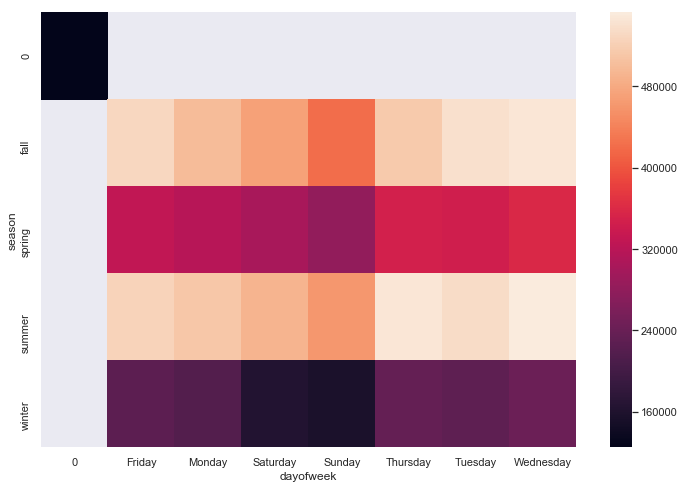

In [108]:
# busiest dow by season
import seaborn as sns

sns.set(rc={'figure.figsize':(12,8)})
hmap = tripdata.groupby(['season', 'dayofweek'])['tripduration'].count().reset_index()
hmap = hmap.rename(columns = {'tripduration':'demand'})
hmap = hmap.pivot('season', 'dayofweek', 'demand')
hmap
ax = sns.heatmap(hmap)

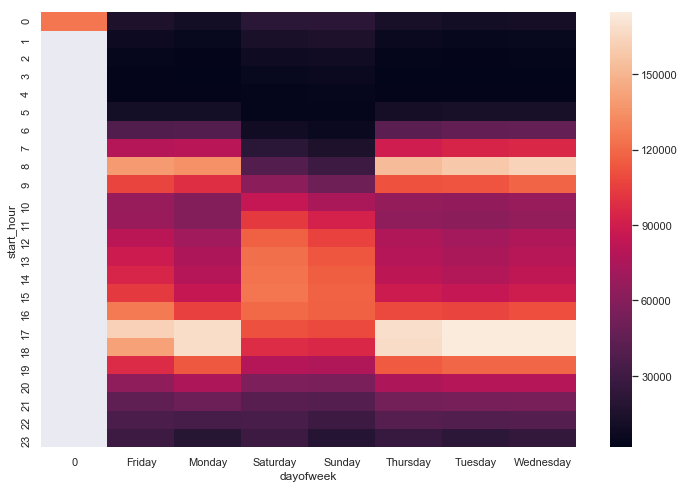

In [109]:
# busiest time by dow

hmap = tripdata.groupby(['start_hour', 'dayofweek'])['tripduration'].count().reset_index()
hmap = hmap.rename(columns = {'tripduration':'demand'})
hmap = hmap.pivot('start_hour', 'dayofweek', 'demand')
ax = sns.heatmap(hmap)


In [24]:
# ride count by seasons
df = pd.DataFrame(tripdata.groupby(['start_hour','season'])['tripduration'].count().reset_index())
df = df.rename(columns = {'tripduration': 'ride_num'})
df = df[df['season'] != 0]
fig = px.line(df, x="start_hour", y="ride_num", color = 'season',
                 title="Ride Count by Hour by Seasons")
fig.update_layout(hovermode="x unified")

fig.show()

In [49]:
# df = pd.DataFrame(tripdata.groupby(['start_hour','season'])['tripduration'].count().reset_index())
# df = df.rename(columns = {'tripduration': 'ride_num'})
df = tripdata[tripdata.season != 0]
df['trip_mins'] = df.tripduration/60
df = df.groupby('season').median()
fig = px.bar(df, x= df.index, y="trip_mins",
                 title="Riding Length by Season")
fig.update_layout(hovermode="x unified")

fig.show()

/Users/bkuo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:4: SettingWithCopyWarning:


A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy



In [60]:
# ride time by age and gender... but age>80~100 seems strange
df = tripdata[tripdata.age != 0]
df = df[tripdata.gender != 0]
df['trip_mins'] = df.tripduration/60
df = df.groupby(['age', 'gender']).median().reset_index()
fig = px.bar(df, x='age', y="trip_mins", color = 'gender',
                 title="Ride Time by Age and Gender")
fig.update_layout(hovermode="x unified")

fig.show()

/Users/bkuo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [68]:
# same graph as above, but only ages <100 and only look at genders with available data
df = tripdata[tripdata.age != 0]
df = df[tripdata.age < 100]
df = df[tripdata.gender != 0]
df['trip_mins'] = df.tripduration/60
df = df.groupby(['age', 'gender']).median().reset_index()
fig = px.bar(df, x='age', y="trip_mins", color = 'gender', barmode = 'overlay',
                 title="Ride Time by Age and Gender")
fig.update_layout(hovermode="x unified")

fig.show()

/Users/bkuo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:2: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.

/Users/bkuo/anaconda3/lib/python3.6/site-packages/ipykernel_launcher.py:3: UserWarning:

Boolean Series key will be reindexed to match DataFrame index.



In [162]:
# overall riding trend through the years
df = tripdata[tripdata.year > 2010]
df = df.groupby([pd.Grouper(key="starttime", freq="M"),'season'])['tripduration'].count().reset_index()
df = df.rename(columns = {'tripduration': 'ride_num', 'starttime':'time'})
fig = px.line(df, x="time", y="ride_num", #color = 'season',
                 title="Demand Trend")
fig.update_layout(hovermode="x unified")


fig.show()

In [161]:
# overall riding trend through the years with season
df = tripdata[tripdata.year > 2010]
df = df.groupby([pd.Grouper(key="starttime", freq="M"),'season'])['tripduration'].count().reset_index()
df = df.rename(columns = {'tripduration': 'ride_num', 'starttime': 'time'})
fig = px.bar(df, x="time", y="ride_num", color = 'season',
                 title="Demand Trend")
fig.update_layout(hovermode="x unified")

fig.show()